<a href="https://colab.research.google.com/github/sgulyano/CMKL41-685/blob/main/41_685lab3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# CMKL41-685 Computer Vision Lab 3

CMKL University

By Sarun Gulyanon


### Goal

Introduce students to image classification using convolutional neural networks (CNNs)


### Outline

In this lab, students will explore different CNN models using TensorFlow/Keras.

0. Download Dataset
1. TensorFlow/Keras
2. Transfer Learning
3. Data augmentation
4. Fine-tuning

### References
- TensorFlow/Keras: https://www.tensorflow.org/tutorials/images
- PyTorch: https://docs.pytorch.org/tutorials/
- [Cat vs. Dog Image Classification Exercise 1](https://colab.research.google.com/github/google/eng-edu/blob/master/ml/pc/exercises/image_classification_part1.ipynb#scrollTo=keyquuYMWPMa)
- [Cat vs. Dog Image Classification Exercise 2](https://colab.research.google.com/github/google/eng-edu/blob/master/ml/pc/exercises/image_classification_part2.ipynb#scrollTo=e8HgwcAbmdcu)

----

## 0. Download Dataset

In this example, we will use a dataset of cats and dogs. First, let's download the dataset and extract it locally for use in our lab.

**NOTE:** The 2,000 images used in this exercise are excerpted from the ["Dogs vs. Cats" dataset](https://www.kaggle.com/c/dogs-vs-cats/data) available on Kaggle, which contains 25,000 images. Here, we use a subset of the full dataset to decrease training time for educational purposes.

In [1]:
import tensorflow as tf
import pathlib

dataset_url = "https://storage.googleapis.com/mledu-datasets/cats_and_dogs_filtered.zip"
data_path = tf.keras.utils.get_file('cats_and_dogs_filtered.zip', origin=dataset_url, extract=True)
data_dir = pathlib.Path(data_path).with_suffix('')

In [2]:
train_dir = list(data_dir.glob('cats_and_dogs_filtered/train/*/*.jpg'))
train_dog_dir = list(data_dir.glob('cats_and_dogs_filtered/train/dogs/*.jpg'))
train_cat_dir = list(data_dir.glob('cats_and_dogs_filtered/train/cats/*.jpg'))
train_dog_dir = list(data_dir.glob('cats_and_dogs_filtered/train/dogs/*.jpg'))
val_dir = list(data_dir.glob('cats_and_dogs_filtered/validation/*/*.jpg'))
val_cat_dir = list(data_dir.glob('cats_and_dogs_filtered/validation/cats/*.jpg'))
val_dog_dir = list(data_dir.glob('cats_and_dogs_filtered/validation/dogs/*.jpg'))
print(f'Training set: Cat = {len(train_cat_dir)}, Dog = {len(train_dog_dir)}')
print(f'Validation set: Cat = {len(val_cat_dir)}, Dog = {len(val_dog_dir)}')
print(f'Training set: {len(train_dir)}, Validation set: {len(val_dir)}')

Training set: Cat = 1000, Dog = 1000
Validation set: Cat = 500, Dog = 500
Training set: 2000, Validation set: 1000


In [3]:
print([p.name for p in train_cat_dir[:5]])
print([p.name for p in train_dog_dir[:5]])

['cat.603.jpg', 'cat.409.jpg', 'cat.530.jpg', 'cat.690.jpg', 'cat.881.jpg']
['dog.39.jpg', 'dog.111.jpg', 'dog.562.jpg', 'dog.176.jpg', 'dog.505.jpg']


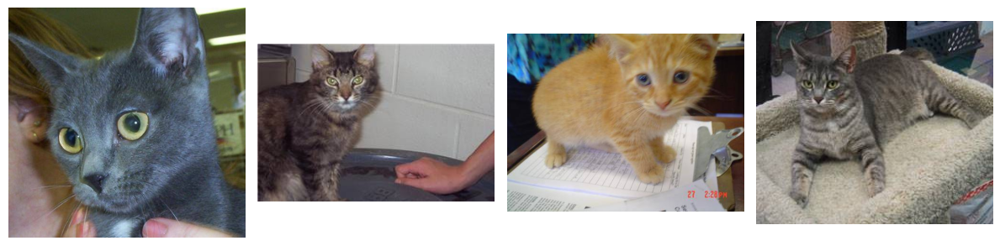

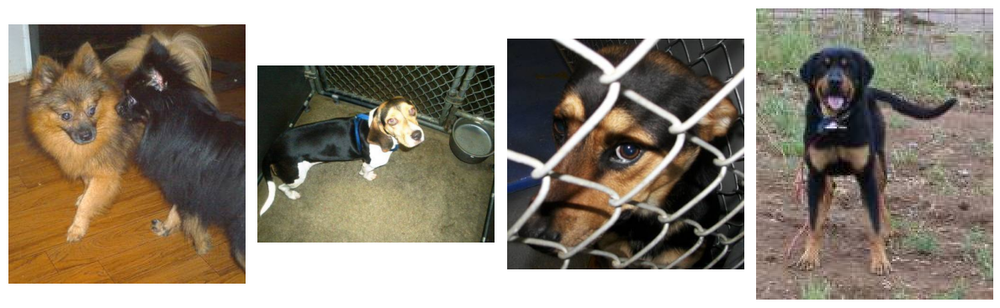

In [4]:
import matplotlib.pyplot as plt
import PIL

def plot_images_with_pil(image_paths, nrows=1, ncols=4):
  fig, axes = plt.subplots(nrows, ncols, figsize=(12, 4))
  for i, image_path in enumerate(image_paths[:nrows * ncols]):
    try:
      img = PIL.Image.open(image_path)
      ax = axes[i // ncols, i % ncols] if nrows > 1 else axes[i]
      ax.imshow(img)
      ax.axis('off')
    except Exception as e:
      print(f"Error loading image {image_path}: {e}")
  plt.tight_layout()
  plt.show()

plot_images_with_pil(train_cat_dir[:4])
plot_images_with_pil(train_dog_dir[:4])


## 1. TensorFlow/Keras

In this section, we will explore several techniques in deep learning using TensorFlow/Keras, including image augmentation, transfer learning, and fine-tuning.

In [5]:
batch_size = 32
img_height = 150
img_width = 150

## 2. Transfer Learning

Transfer learning allows us to leverage pre-trained models, such as VGG16, and adapt them to a new task. The typical workflow involves:

1. Load the base model: Use a pre-trained model without its top classifier layers.
2. Add a custom classifier on top: Build new layers for your specific task (e.g., binary classification for cats vs. dogs).
3. Compile the model: Specify the loss function, optimizer, and evaluation metrics before training.

In [6]:
###############################
# Change the base model here
###############################
from tensorflow.keras.applications import VGG16
from tensorflow.keras.applications.vgg16 import preprocess_input
###############################

from tensorflow.keras.models import Model
from tensorflow.keras.layers import Flatten, Dense, Dropout
from tensorflow.keras.optimizers import Adam

# 1. Load VGG16 base model
base_model = VGG16(weights='imagenet', include_top=False, input_shape=(img_height, img_width, 3))

# Freeze convolutional base
for layer in base_model.layers:
    layer.trainable = False

# 2. Add custom classifier on top
x = base_model.output
x = Flatten()(x)
x = Dense(512, activation='relu')(x)
x = Dropout(0.5)(x)
predictions = Dense(1, activation='sigmoid')(x)  # binary classification

model = Model(inputs=base_model.input, outputs=predictions)

# 3. Compile the model
model.compile(
    optimizer=Adam(learning_rate=1e-4),
    loss='binary_crossentropy',
    metrics=['accuracy']
)

In [7]:
model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 150, 150, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, 150, 150, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 150, 150, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_pool (MaxPooling2D)      │ (None, 75, 75, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 75, 75, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 75, 75, 128)    │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_pool (MaxPooling2D)      │ (None, 37, 37, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv1 (Conv2D)           │ (None, 37, 37, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv2 (Conv2D)           │ (None, 37, 37, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv3 (Conv2D)           │ (None, 37, 37, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_pool (MaxPooling2D)      │ (None, 18, 18, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv1 (Conv2D)           │ (None, 18, 18, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv2 (Conv2D)           │ (None, 18, 18, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv3 (Conv2D)           │ (None, 18, 18, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_pool (MaxPooling2D)      │ (None, 9, 9, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv1 (Conv2D)           │ (None, 9, 9, 512)      │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv2 (Conv2D)           │ (None, 9, 9, 512)      │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv3 (Conv2D)           │ (None, 9, 9, 512)      │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_pool (MaxPooling2D)      │ (None, 4, 4, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 8192)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 512)            │     4,194,816 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 1)              │           513 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 18,910,017 (72.14 MB)

 Trainable params: 4,195,329 (16.00 MB)

 Non-trainable params: 14,714,688 (56.13 MB)

## 3. Data augmentation

Data augmentation is a technique used to artificially increase the size and diversity of a training dataset by applying random transformations to the original images. Common transformations include rotation, shifting, zooming, shearing, and flipping. These changes help the model generalize better by exposing it to variations it might encounter in real-world data, reducing the risk of overfitting. In Keras, `ImageDataGenerator` makes it easy to apply these transformations on the fly while training a model.

In [8]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Adding rescale, rotation_range, width_shift_range, height_shift_range,
# shear_range, zoom_range, and horizontal flip to our ImageDataGenerator
train_datagen = ImageDataGenerator(
    preprocessing_function=preprocess_input,
    rotation_range=40,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,)

# Note that the validation data should not be augmented!
val_datagen = ImageDataGenerator(preprocessing_function=preprocess_input)

# Flow training images in batches of 32 using train_datagen generator
train_generator = train_datagen.flow_from_directory(
        data_dir / 'cats_and_dogs_filtered/train',  # This is the source directory for training images
        target_size=(img_height, img_width),  # All images will be resized to 150x150
        batch_size=batch_size,
        # Since we use binary_crossentropy loss, we need binary labels
        class_mode='binary')

# Flow validation images in batches of 32 using val_datagen generator
validation_generator = val_datagen.flow_from_directory(
        data_dir / 'cats_and_dogs_filtered/validation',
        target_size=(img_height, img_width),
        batch_size=batch_size,
        class_mode='binary')

Found 2000 images belonging to 2 classes.
Found 1000 images belonging to 2 classes.


Sanity Check: Display augmented images

In [9]:
from tensorflow.keras.preprocessing.image import load_img, img_to_array

img_path = data_dir/'cats_and_dogs_filtered/train/cats/cat.603.jpg'  # replace with your image path
img = load_img(img_path, target_size=(img_height, img_width))  # resize image
x = img_to_array(img)  # convert to NumPy array
x = x.reshape((1,) + x.shape)  # reshape to (1, height, width, channels)

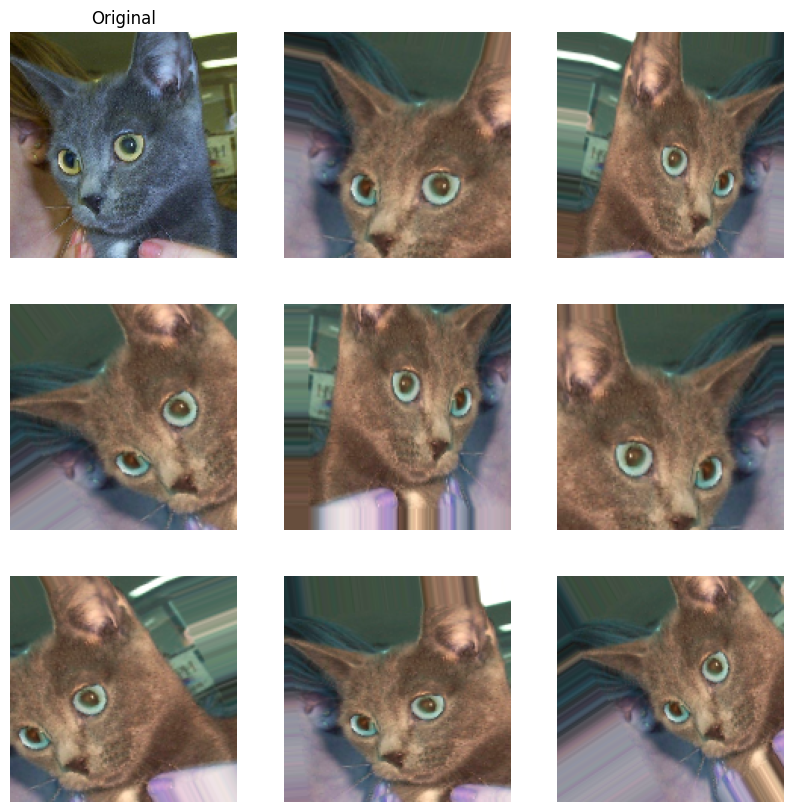

In [10]:
# Generate and plot augmented images
plt.figure(figsize=(10, 10))
plt.subplot(3, 3, 1)
plt.imshow(x[0]/255)
plt.axis('off')
plt.title('Original')
i = 1
for batch in train_datagen.flow(x, batch_size=1):
    plt.subplot(3, 3, i + 1)
    plt.imshow((batch[0]+127)/255)
    plt.axis('off')
    i += 1
    if i % 9 == 0:
        break
plt.show()

Logging using Tensorboard

In [11]:
import datetime

# Create a unique log directory for each run
log_dir = "logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)

In [12]:
history = model.fit(
    train_generator,
    steps_per_epoch=train_generator.samples // batch_size,
    validation_data=validation_generator,
    validation_steps=validation_generator.samples // batch_size,
    epochs=10,
    callbacks=[tensorboard_callback]
)

/usr/local/lib/python3.12/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 40s 471ms/step - accuracy: 0.7419 - loss: 4.3380 - val_accuracy: 0.9506 - val_loss: 0.6574
Epoch 2/10
 1/62 ━━━━━━━━━━━━━━━━━━━━ 9s 148ms/step - accuracy: 0.8750 - loss: 1.9084

/usr/local/lib/python3.12/dist-packages/keras/src/trainers/epoch_iterator.py:116: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self._interrupted_warning()


62/62 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - accuracy: 0.8750 - loss: 1.9084 - val_accuracy: 0.9516 - val_loss: 0.6748
Epoch 3/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 42s 677ms/step - accuracy: 0.8917 - loss: 1.5283 - val_accuracy: 0.9577 - val_loss: 0.5936
Epoch 4/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 7s 117ms/step - accuracy: 0.8750 - loss: 0.2376 - val_accuracy: 0.9567 - val_loss: 0.6023
Epoch 5/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 22s 359ms/step - accuracy: 0.9179 - loss: 1.1316 - val_accuracy: 0.9607 - val_loss: 0.4725
Epoch 6/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 8s 125ms/step - accuracy: 0.9062 - loss: 0.9234 - val_accuracy: 0.9607 - val_loss: 0.5167
Epoch 7/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 33s 356ms/step - accuracy: 0.9338 - loss: 0.7891 - val_accuracy: 0.9536 - val_loss: 0.6013
Epoch 8/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 7s 116ms/step - accuracy: 0.9062 - loss: 0.4388 - val_accuracy: 0.9526 - val_loss: 0.6247
Epoch 9/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 42s 677ms/step - accuracy: 0.9333 - loss: 0.8159 - val_accuracy: 0.9647 - 

In [13]:
%load_ext tensorboard
%tensorboard --logdir logs/fit

<IPython.core.display.Javascript object>

## 4. Fine-tuning

Fine-tuning is the process of unfreezing the pre-trained model and training them alongside the custom classifier. This allows the model to slightly adjust the pre-trained features to better fit the new dataset. Typically, a smaller learning rate is used during fine-tuning to avoid large updates that could destroy the useful pre-trained weights.

In [14]:
# Unfreeze top layers of VGG16 for fine-tuning
for layer in base_model.layers[-4:]:
    layer.trainable = True

model.compile(
    optimizer=Adam(learning_rate=5e-6),  # smaller learning rate for fine-tuning
    loss='binary_crossentropy',
    metrics=['accuracy']
)

In [19]:
# Create a unique log directory for each run
ft_log_dir = "logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S") + 'ft'
tensorboard_ft_callback = tf.keras.callbacks.TensorBoard(log_dir=ft_log_dir, histogram_freq=1)

In [20]:
history_fine = model.fit(
    train_generator,
    steps_per_epoch=train_generator.samples // batch_size,
    validation_data=validation_generator,
    validation_steps=validation_generator.samples // batch_size,
    epochs=2,
    callbacks=[tensorboard_ft_callback]  # reuse the same callback
)

Epoch 1/2
62/62 ━━━━━━━━━━━━━━━━━━━━ 23s 368ms/step - accuracy: 0.9416 - loss: 0.4779 - val_accuracy: 0.9597 - val_loss: 0.4707
Epoch 2/2
 1/62 ━━━━━━━━━━━━━━━━━━━━ 10s 169ms/step - accuracy: 1.0000 - loss: 0.0036

/usr/local/lib/python3.12/dist-packages/keras/src/trainers/epoch_iterator.py:116: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self._interrupted_warning()


62/62 ━━━━━━━━━━━━━━━━━━━━ 10s 157ms/step - accuracy: 1.0000 - loss: 0.0036 - val_accuracy: 0.9597 - val_loss: 0.4751


Try predicting the class of an image.

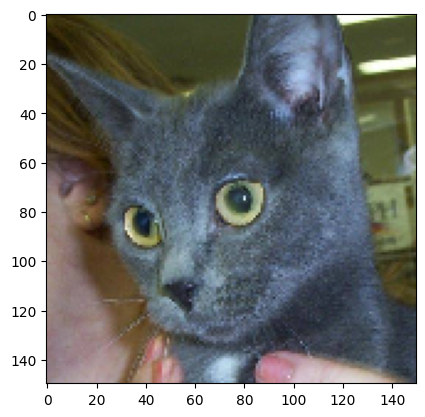

In [16]:
plt.imshow(x.squeeze()/255)

In [17]:
print(train_generator.class_indices)

{'cats': 0, 'dogs': 1}


In [18]:
preds = model.predict(x)
pred_class = (preds > 0.5).astype(int)
print(f'class: {pred_class[0][0]}')
print(preds)

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
class: 0
[[0.]]


----
# Exercise

Try using different base models for transfer learning. For example:

- [ResNet50](https://www.tensorflow.org/api_docs/python/tf/keras/applications/ResNet50)
- [MobileNetV2](https://www.tensorflow.org/api_docs/python/tf/keras/applications/MobileNetV2)
- [InceptionV3](https://www.tensorflow.org/api_docs/python/tf/keras/applications/InceptionV3)
- [EfficientNetB0](https://www.tensorflow.org/api_docs/python/tf/keras/applications/EfficientNetB0)

Explore how changing the base model affects accuracy, training time, and fine-tuning performance.

----